# GSIFT Demo on 2D Gaussian Images

Apply a simplified GSIFT-style descriptor to two mipnerf360 views stored as 2D Gaussian mixtures (Instant-GI checkpoints).

In [19]:
import sys
from pathlib import Path

sys.path.append(str(Path.cwd().parent))
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

from scripts.load_gaussian_params import load_gaussian_parameters


## Load Saved Gaussian Renders
Locate two views (gt.png + gaussian_model.pth.tar). Adjust paths if you want different frames.

In [20]:
# Paths for two mipnerf360 views
repo_root = Path.cwd()
if repo_root.name == "notebooks":
    repo_root = repo_root.parent
elif not (repo_root / "scripts").exists():
    repo_root = repo_root.parent

data_root = repo_root / "data" / "garden_d4" / "output" / "garden_d4"
view_one = data_root / "DSC07956" / "net"
view_two = data_root / "DSC07957" / "net"

gt1_path = view_one / "gt.png"
gt2_path = view_two / "gt.png"
g1_path = view_one / "gaussian_model.pth.tar"
g2_path = view_two / "gaussian_model.pth.tar"

for p in [gt1_path, gt2_path, g1_path, g2_path]:
    if not p.exists():
        raise FileNotFoundError(f"Missing file: {p}")

gt1_path, gt2_path, g1_path, g2_path


(WindowsPath('c:/Users/Eric/Projects/2dgs/data/garden_d4/output/garden_d4/DSC07956/net/gt.png'),
 WindowsPath('c:/Users/Eric/Projects/2dgs/data/garden_d4/output/garden_d4/DSC07957/net/gt.png'),
 WindowsPath('c:/Users/Eric/Projects/2dgs/data/garden_d4/output/garden_d4/DSC07956/net/gaussian_model.pth.tar'),
 WindowsPath('c:/Users/Eric/Projects/2dgs/data/garden_d4/output/garden_d4/DSC07957/net/gaussian_model.pth.tar'))

In [21]:
# Read GT images and gaussian parameters
def load_view(gt_path, model_path):
    gt_img = np.array(Image.open(gt_path).convert("RGB"))
    params = load_gaussian_parameters(model_path, init_method="net")
    return gt_img, params

gt_img1, params1 = load_view(gt1_path, g1_path)
gt_img2, params2 = load_view(gt2_path, g2_path)

gaussians1 = params1["gaussians"]
gaussians2 = params2["gaussians"]

print(f"View 1 gaussians: {gaussians1.shape[0]}")
print(f"View 2 gaussians: {gaussians2.shape[0]}")


View 1 gaussians: 50273
View 2 gaussians: 50461


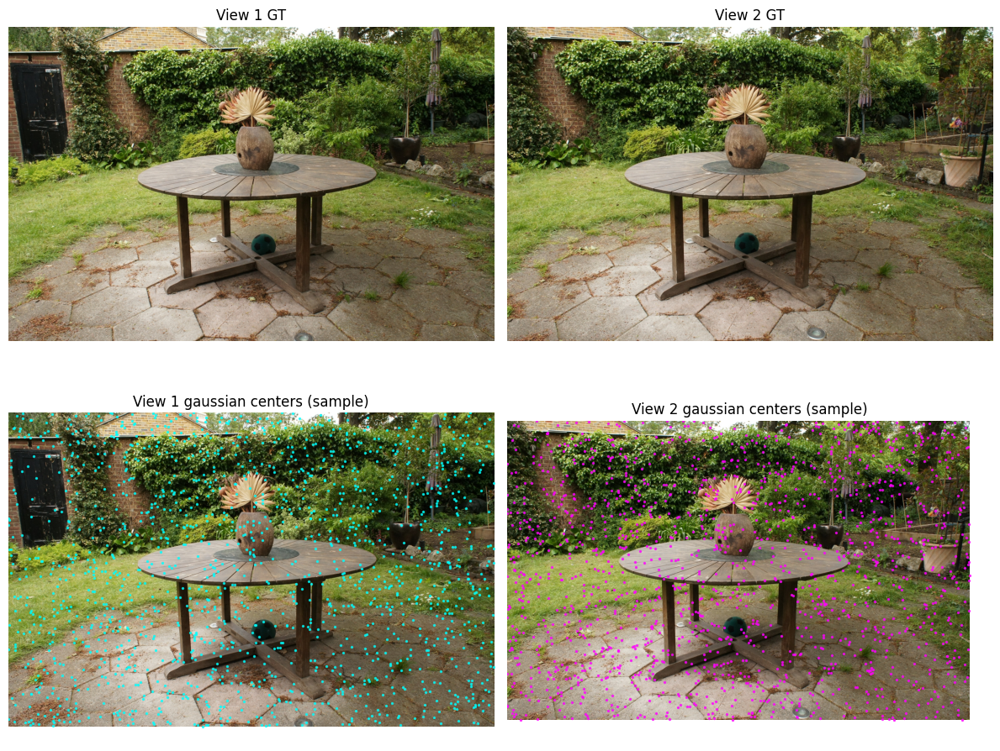

In [22]:
# Quick visualization of gaussian centers on top of GT images
def xy_to_pixel(xy, img):
    h, w = img.shape[:2]
    xy_px = xy.copy()
    xy_px[:, 0] = (xy_px[:, 0] + 1) * w / 2
    xy_px[:, 1] = (xy_px[:, 1] + 1) * h / 2
    return xy_px

xy1_px = xy_to_pixel(params1["xy"], gt_img1)
xy2_px = xy_to_pixel(params2["xy"], gt_img2)

rng = np.random.default_rng(0)
sample_count = 1500
idx1 = rng.choice(len(xy1_px), size=min(sample_count, len(xy1_px)), replace=False)
idx2 = rng.choice(len(xy2_px), size=min(sample_count, len(xy2_px)), replace=False)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(gt_img1)
axes[0, 0].set_title("View 1 GT")
axes[0, 0].axis('off')
axes[0, 1].imshow(gt_img2)
axes[0, 1].set_title("View 2 GT")
axes[0, 1].axis('off')

axes[1, 0].imshow(gt_img1)
axes[1, 0].scatter(xy1_px[idx1, 0], xy1_px[idx1, 1], s=2, c='cyan', alpha=0.7)
axes[1, 0].set_title("View 1 gaussian centers (sample)")
axes[1, 0].axis('off')

axes[1, 1].imshow(gt_img2)
axes[1, 1].scatter(xy2_px[idx2, 0], xy2_px[idx2, 1], s=2, c='magenta', alpha=0.7)
axes[1, 1].set_title("View 2 gaussian centers (sample)")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


## GSIFT Descriptor on Loaded Gaussians
A lightweight GSIFT-style descriptor: compute gradient histograms over a local patch around each Gaussian using its anisotropic covariance.

In [23]:
def covariance_from_params(scale, theta):
    c = torch.cos(theta)
    s = torch.sin(theta)
    R = torch.stack([torch.stack([c, -s], dim=-1),
                     torch.stack([s,  c], dim=-1)], dim=-2)  # [N,2,2]
    diag = torch.zeros(scale.shape[0], 2, 2, device=scale.device)
    diag[:, 0, 0] = scale[:, 0] ** 2
    diag[:, 1, 1] = scale[:, 1] ** 2
    return R @ diag @ R.transpose(-1, -2)

def gaussian_pdf(x, mu, Sigma):
    diff = x - mu
    inv = torch.inverse(Sigma)
    expo = -0.5 * (diff.unsqueeze(-2) @ inv @ diff.unsqueeze(-1)).squeeze(-1).squeeze(-1)
    norm = (2 * torch.pi) * torch.sqrt(torch.clamp(torch.det(Sigma), min=1e-9))
    return torch.exp(expo) / torch.clamp(norm, min=1e-9)

def gaussian_grad(x, mu, Sigma):
    diff = x - mu
    inv = torch.inverse(Sigma)
    pdf = gaussian_pdf(x, mu, Sigma)
    grad = -pdf.unsqueeze(-1) * (inv @ diff.unsqueeze(-1)).squeeze(-1)
    return grad

def gsift_descriptor(idx, means, covs, weights, grid_size=4, bins=8, patch_scale=3.0):
    mu = means[idx]
    Sigma = covs[idx]
    # Patch radius scaled to the gaussian size
    radius = patch_scale * torch.sqrt(torch.mean(torch.diagonal(Sigma, dim1=-2, dim2=-1)))
    coords = torch.linspace(-radius, radius, steps=grid_size * 4)
    N = len(coords)
    yy, xx = torch.meshgrid(coords, coords, indexing="ij")
    offsets = torch.stack([xx, yy], dim=-1).reshape(-1, 2)
    pts = mu.unsqueeze(0) + offsets

    grads = gaussian_grad(pts, mu, Sigma)
    mag = torch.linalg.norm(grads, dim=-1) * weights[idx]
    ang = torch.atan2(grads[:, 1], grads[:, 0]) % (2 * torch.pi)

    mag_grid = mag.view(N, N)
    ang_grid = ang.view(N, N)
    cell = N // grid_size
    desc_parts = []
    for gx in range(grid_size):
        for gy in range(grid_size):
            mcell = mag_grid[gx * cell:(gx + 1) * cell, gy * cell:(gy + 1) * cell].reshape(-1)
            acell = ang_grid[gx * cell:(gx + 1) * cell, gy * cell:(gy + 1) * cell].reshape(-1)
            hist = torch.zeros(bins, device=means.device)
            if len(mcell) > 0:
                bin_idx = torch.clamp((acell / (2 * torch.pi) * bins).long(), 0, bins - 1)
                for b in range(bins):
                    hist[b] = mcell[bin_idx == b].sum()
            desc_parts.append(hist)
    desc = torch.cat(desc_parts)
    desc = desc / (torch.norm(desc) + 1e-8)
    return desc

def build_descriptors(gaussians, max_points=800, device="cpu"):
    xy = torch.from_numpy(gaussians[:, 0:2]).float().to(device)
    scale = torch.from_numpy(gaussians[:, 2:4]).float().to(device)
    rot = torch.from_numpy(gaussians[:, 4]).float().to(device)
    opacity = torch.from_numpy(gaussians[:, 5]).float().to(device)
    covs = covariance_from_params(scale, rot)
    idx = torch.randperm(xy.shape[0])[:max_points]
    xy_sel = xy[idx]
    covs_sel = covs[idx]
    w_sel = opacity[idx]
    descs = torch.stack([gsift_descriptor(i, xy_sel, covs_sel, w_sel) for i in range(len(idx))])
    return xy_sel.cpu().numpy(), descs.cpu().numpy(), idx.cpu().numpy()


def rotation_invariant_descriptor(gaussians, max_points=800, grid_size=4, bins=8, patch_scale=3.0, device="cuda"):
    # ... (Standard setup as before) ...
    xy = torch.from_numpy(gaussians[:, 0:2]).float().to(device)
    scale = torch.from_numpy(gaussians[:, 2:4]).float().to(device)
    rot = torch.from_numpy(gaussians[:, 4]).float().to(device) # Theta
    opacity = torch.from_numpy(gaussians[:, 5]).float().to(device)
    
    idx = torch.randperm(xy.shape[0])[:max_points]
    
    # Selected Params
    mu = xy[idx]       # [N, 2]
    s = scale[idx]     # [N, 2]
    theta = rot[idx]   # [N]
    w = opacity[idx]   # [N]
    
    # 1. Create Base Grid
    steps = grid_size * 4
    t = torch.linspace(-1, 1, steps, device=device)
    yy, xx = torch.meshgrid(t, t, indexing="ij")
    base_grid = torch.stack([xx, yy], dim=-1).reshape(-1, 2) # [G, 2]
    
    # 2. ROTATE THE GRID by -Theta (or +Theta) to align with Gaussian orientation
    # We want the grid to rotate with the object.
    c = torch.cos(theta)
    s_sin = torch.sin(theta)
    # Rotation matrices for each gaussian: [N, 2, 2]
    R = torch.stack([torch.stack([c, -s_sin], dim=-1),
                     torch.stack([s_sin,  c], dim=-1)], dim=-2)
    
    # Scale based on gaussian size (average scale)
    radii = patch_scale * s.mean(dim=1).unsqueeze(1).unsqueeze(1) # [N, 1, 1]
    
    # Apply Rotation and Scale to the grid offsets
    # grid: [1, G, 2] -> [N, G, 2]
    offsets = torch.einsum('nij,gj->ngi', R, base_grid) * radii
    
    pts = mu.unsqueeze(1) + offsets # [N, G, 2] coordinates to sample
    
    # 3. Calculate Gradients (Standard PDF math)
    # Recalculate Covariance for gradient math
    diag = torch.zeros(len(idx), 2, 2, device=device)
    diag[:,0,0]=s[:,0]**2; diag[:,1,1]=s[:,1]**2
    covs = R @ diag @ R.transpose(-1, -2)
    
    inv_sigma = torch.inverse(covs + torch.eye(2, device=device)*1e-6)
    diff = pts - mu.unsqueeze(1)
    
    # PDF & Grads
    mahalanobis = torch.einsum('bgi,bij,bgj->bg', diff, inv_sigma, diff)
    pdf = torch.exp(-0.5 * mahalanobis)
    grads = -pdf.unsqueeze(-1) * torch.einsum('bij,bgj->bgi', inv_sigma, diff)
    
    # 4. ROTATION INVARIANT ANGLES
    # The gradient angle in the image frame
    grad_ang_image = torch.atan2(grads[..., 1], grads[..., 0])
    
    # CRITICAL FIX: Subtract the Gaussian's own rotation
    # This makes the angle relative to the Gaussian's local coordinate system
    rel_ang = (grad_ang_image - theta.unsqueeze(1)) % (2 * torch.pi)
    
    mag = torch.linalg.norm(grads, dim=-1) * w.unsqueeze(1)
    
    # 5. Binning (Spatial + Angular)
    # Use base_grid (unrotated) to determine spatial bin (top-left, bottom-right, etc.)
    cell_x = ((base_grid[:, 0] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    cell_y = ((base_grid[:, 1] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    spatial_idx = cell_y * grid_size + cell_x # [G]
    
    # Use rel_ang for angular bin
    ang_idx = (rel_ang / (2 * torch.pi) * bins).long().clamp(0, bins - 1) # [N, G]
    
    flat_idx = spatial_idx.unsqueeze(0) * bins + ang_idx
    
    descs = torch.zeros(len(idx), grid_size*grid_size*bins, device=device)
    descs.scatter_add_(1, flat_idx, mag)
    descs = descs / (torch.norm(descs, dim=1, keepdim=True) + 1e-8)
    
    return mu.cpu().numpy(), descs.cpu().numpy(), idx.cpu().numpy()


In [37]:
import torch

def build_covariance(scale, theta):
    c = torch.cos(theta)
    s = torch.sin(theta)
    # R = [[c, -s], [s, c]]
    # Sigma = R @ diag(scale^2) @ R.T
    
    # We can do this manually for speed
    s0_sq = scale[:, 0]**2
    s1_sq = scale[:, 1]**2
    
    cov = torch.zeros(scale.shape[0], 2, 2, device=scale.device)
    cov[:, 0, 0] = c**2 * s0_sq + s**2 * s1_sq
    cov[:, 0, 1] = c * s * (s0_sq - s1_sq)
    cov[:, 1, 0] = cov[:, 0, 1]
    cov[:, 1, 1] = s**2 * s0_sq + c**2 * s1_sq
    return cov

def gaussian_density_gradient_batch(sample_pts, neighbor_mu, neighbor_cov, neighbor_w):
    """
    Computes the gradient of the Sum of Gaussians at sample_pts.
    
    sample_pts:   [B, Grid_Size, 2]
    neighbor_mu:  [B, K, 2]
    neighbor_cov: [B, K, 2, 2]
    neighbor_w:   [B, K]
    """
    B, G, _ = sample_pts.shape
    _, K, _ = neighbor_mu.shape
    
    # Diff: [B, G, K, 2]
    # sample_pts[b, g] - neighbor_mu[b, k]
    diff = sample_pts.unsqueeze(2) - neighbor_mu.unsqueeze(1) 
    
    # Inverse Covariance
    # Add epsilon to diagonal for stability
    eye = torch.eye(2, device=sample_pts.device).view(1, 1, 2, 2) * 1e-6
    
    # Fix: Keep shape as [B, K, 2, 2] instead of unsqueezing to [B, 1, K, 2, 2]
    # Broadcasting will handle the addition of 'eye' automatically
    inv_sigma = torch.inverse(neighbor_cov.unsqueeze(1) + eye).squeeze(1) # Result: [B, K, 2, 2]
    
    # Mahalanobis distance calculation
    # Diff is [B, G, K, 2] (has grid dim)
    # Inv_Sigma is [B, K, 2, 2] (no grid dim)
    # Einsum will automatically broadcast inv_sigma across the 'g' dimension of diff
    
    # 'bgki': diff [Batch, Grid, Neighbor, dim_i]
    # 'bkij': inv_sigma [Batch, Neighbor, dim_i, dim_j]
    # -> 'bgkj': Result [Batch, Grid, Neighbor, dim_j]
    term1 = torch.einsum('bgki, bkij -> bgkj', diff, inv_sigma)
    
    # Dot product with diff again
    mahalanobis = (term1 * diff).sum(dim=-1) # [B, G, K]
    
    # PDF Calculation
    det = torch.det(neighbor_cov).unsqueeze(1) # [B, 1, K]
    norm = 2 * torch.pi * torch.sqrt(det.clamp_min(1e-9))
    pdf = torch.exp(-0.5 * mahalanobis) / norm # [B, G, K]
    
    # Weighted PDF
    weighted_pdf = pdf * neighbor_w.unsqueeze(1) # [B, G, K]
    
    # Analytic Gradient: -PDF * (Sigma^-1 * diff)
    grad_contributions = -weighted_pdf.unsqueeze(-1) * term1
    
    # Sum contributions from all K neighbors
    total_grad = grad_contributions.sum(dim=2) # [B, G, 2]
    
    return total_grad

def density_sift_descriptor(gaussians, max_points=1000, neighbor_k=32, grid_size=4, bins=8, patch_scale=4.0, device=None):
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
        
    # 1. Setup Data
    gauss_tensor = torch.as_tensor(gaussians, device=device, dtype=torch.float32)
    N_total = gauss_tensor.shape[0]
    
    # Select Targets
    # We use a subset of points as "Keypoints"
    idx = torch.randperm(N_total, device=device)[:max_points]
    targets = gauss_tensor[idx]
    
    # Unpack Targets
    t_mu = targets[:, 0:2]    # [M, 2]
    t_scale = targets[:, 2:4] # [M, 2]
    t_rot = targets[:, 4]     # [M]
    
    # 2. Find Neighbors (KNN)
    # We need the local neighborhood for every target to compute the density field.
    # Brute force distance matrix [M, N] (Okay for N < 20k, else use FAISS/chunks)
    all_mu = gauss_tensor[:, 0:2]
    dists = torch.cdist(t_mu, all_mu) # [M, N_total]
    
    # Get top K neighbors for each target
    # We include the point itself as a neighbor (it contributes to density)
    _, nn_idx = dists.topk(neighbor_k, largest=False) # [M, K]
    
    # Gather Neighbor Data
    n_data = gauss_tensor[nn_idx] # [M, K, 6]
    n_mu = n_data[..., 0:2]
    n_scale = n_data[..., 2:4]
    n_rot = n_data[..., 4]
    n_w = n_data[..., 5]
    n_cov = build_covariance(n_scale.reshape(-1, 2), n_rot.reshape(-1)).view(idx.shape[0], neighbor_k, 2, 2)
    
    # 3. Build Sampling Grid (Oriented to Target)
    # SIFT grid: 4x4 subregions. Let's sample 2x2 points within each subregion for precision.
    # Total samples = (grid_size * 2)^2
    res = grid_size * 2
    steps = torch.linspace(-1, 1, res, device=device)
    y, x = torch.meshgrid(steps, steps, indexing="ij")
    base_grid = torch.stack([x, y], dim=-1).reshape(-1, 2) # [G, 2]
    
    # Transform grid to World Space using TARGET params
    # This ensures Rotation/Scale Invariance
    c, s = torch.cos(t_rot), torch.sin(t_rot)
    R_target = torch.stack([torch.stack([c, -s], dim=-1), torch.stack([s, c], dim=-1)], dim=-2)
    
    # Scale factor: use mean of target scale * patch_scale
    radius = patch_scale * t_scale.mean(dim=1).unsqueeze(1).unsqueeze(1) # [M, 1, 1]
    
    # Rotated offsets: [M, G, 2]
    offsets = torch.einsum('mij,gj->mgi', R_target, base_grid) * radius
    sample_pts = t_mu.unsqueeze(1) + offsets
    
    # 4. Compute Analytic Gradients
    # This is the "Density Gradient"
    grads = gaussian_density_gradient_batch(sample_pts, n_mu, n_cov, n_w) # [M, G, 2]
    
    # 5. SIFT Histogramming
    # Calculate Magnitude and Angle
    mag = torch.linalg.norm(grads, dim=-1) # [M, G]
    ang = torch.atan2(grads[..., 1], grads[..., 0])
    
    # ROTATION INVARIANCE: Subtract target rotation
    # This aligns the gradient direction to the keypoint's orientation
    rel_ang = (ang - t_rot.unsqueeze(1)) % (2 * torch.pi)
    
    # Spatial Binning
    # Map base_grid [-1, 1] to [0, grid_size]
    cell_x = ((base_grid[:, 0] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    cell_y = ((base_grid[:, 1] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    spatial_idx = cell_y * grid_size + cell_x # [G]
    
    # Angular Binning
    ang_idx = (rel_ang / (2 * torch.pi) * bins).long().clamp(0, bins - 1) # [M, G]
    
    # Flatten indices
    flat_idx = spatial_idx.unsqueeze(0) * bins + ang_idx # [M, G]
    
    # Accumulate
    desc = torch.zeros(idx.shape[0], grid_size*grid_size*bins, device=device)
    desc.scatter_add_(1, flat_idx, mag)
    
    # Normalization (RootSIFT style often works best, but L2 is standard)
    desc = desc / (torch.norm(desc, dim=1, keepdim=True) + 1e-8)
    desc = torch.clamp(desc, max=0.2)
    desc = desc / (torch.norm(desc, dim=1, keepdim=True) + 1e-8)
    
    return t_mu.cpu().numpy(), desc.cpu().numpy(), idx.cpu().numpy()

In [42]:
import torch

# Reuse the helper from before
def build_covariance(scale, theta):
    c = torch.cos(theta); s = torch.sin(theta)
    s0_sq = scale[:, 0]**2; s1_sq = scale[:, 1]**2
    cov = torch.zeros(scale.shape[0], 2, 2, device=scale.device)
    cov[:, 0, 0] = c**2 * s0_sq + s**2 * s1_sq
    cov[:, 0, 1] = c * s * (s0_sq - s1_sq)
    cov[:, 1, 0] = cov[:, 0, 1]
    cov[:, 1, 1] = s**2 * s0_sq + c**2 * s1_sq
    return cov

def get_knn_chunked_exclude_self(targets, all_points, k=32, chunk_size=1000):
    """Finds k neighbors EXCLUDING the point itself (distance > 0)."""
    M = targets.shape[0]
    indices = []
    # We ask for k+1 neighbors because the closest one is the point itself
    real_k = k + 1 
    
    for i in range(0, M, chunk_size):
        end = min(i + chunk_size, M)
        t_chunk = targets[i:end]
        dists = torch.cdist(t_chunk, all_points)
        
        # Get k+1 closest
        _, idx = dists.topk(real_k, largest=False, dim=1) 
        
        # Discard the first column (index 0 is the point itself)
        # Result is [Chunk, k] neighbors
        indices.append(idx[:, 1:]) 
        
    return torch.cat(indices, dim=0)

def density_sift_v2(gaussians, max_points=2000, neighbor_k=32, grid_size=4, bins=8, patch_scale=4.0, device=None):
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    gauss_tensor = torch.as_tensor(gaussians, device=device, dtype=torch.float32)
    N_total = gauss_tensor.shape[0]
    
    # 1. Select Targets
    idx = torch.randperm(N_total, device=device)[:max_points]
    targets = gauss_tensor[idx]
    
    t_mu = targets[:, 0:2]
    t_scale = targets[:, 2:4]
    # NOTE: We Ignore t_rot here! We will compute orientation later.
    
    # 2. Neighbors (Excluding Self)
    # FIX A: Prevents the target from dominating its own descriptor
    safe_mem = 500 * 1024 * 1024 
    adaptive_chunk = max(10, int(safe_mem / (4 * N_total)))
    
    nn_idx = get_knn_chunked_exclude_self(t_mu, gauss_tensor[:,0:2], k=neighbor_k, chunk_size=adaptive_chunk)
    
    n_data = gauss_tensor[nn_idx] # [M, K, 6]
    n_mu = n_data[..., 0:2]; n_scale = n_data[..., 2:4]; n_rot = n_data[..., 4]; n_w = n_data[..., 5]
    n_cov = build_covariance(n_scale.reshape(-1, 2), n_rot.reshape(-1)).view(idx.shape[0], neighbor_k, 2, 2)

    # 3. Initial Sampling (Upright) to find Main Orientation
    # We sample a circular ring to find the dominant gradient angle
    ring_res = 12
    angles = torch.linspace(0, 2*torch.pi, ring_res, device=device)
    ring_x = torch.cos(angles); ring_y = torch.sin(angles)
    base_ring = torch.stack([ring_x, ring_y], dim=-1) # [R, 2]
    
    radius = patch_scale * t_scale.mean(dim=1).unsqueeze(1).unsqueeze(1) # [M, 1, 1]
    
    # Sample in World Space (No rotation applied yet)
    ring_pts = t_mu.unsqueeze(1) + base_ring.unsqueeze(0) * radius # [M, R, 2]
    
    # Compute gradients on the ring
    # Reuse the gradient function from previous step
    ring_grads = gaussian_density_gradient_batch(ring_pts, n_mu, n_cov, n_w) # [M, R, 2]
    
    # Average gradient direction in the neighborhood
    avg_grad = ring_grads.sum(dim=1) # [M, 2]
    
    # FIX B: Computed Orientation
    # This angle represents the "flow" of the density field
    computed_theta = torch.atan2(avg_grad[:, 1], avg_grad[:, 0]) # [M]

    # 4. Build Final Grid (Rotated by Computed Theta)
    res = grid_size * 2
    steps = torch.linspace(-1, 1, res, device=device)
    y, x = torch.meshgrid(steps, steps, indexing="ij")
    base_grid = torch.stack([x, y], dim=-1).reshape(-1, 2)
    
    # Rotate Grid by computed_theta
    c = torch.cos(computed_theta); s = torch.sin(computed_theta)
    R = torch.stack([torch.stack([c, -s], dim=-1), torch.stack([s, c], dim=-1)], dim=-2)
    
    offsets = torch.einsum('mij,gj->mgi', R, base_grid) * radius
    sample_pts = t_mu.unsqueeze(1) + offsets
    
    # 5. Compute Final Gradients
    grads = gaussian_density_gradient_batch(sample_pts, n_mu, n_cov, n_w)
    
    mag = torch.linalg.norm(grads, dim=-1)
    ang = torch.atan2(grads[..., 1], grads[..., 0])
    
    # Normalize angles relative to the computed orientation
    rel_ang = (ang - computed_theta.unsqueeze(1)) % (2 * torch.pi)
    
    # 6. Binning & Histogram
    cell_x = ((base_grid[:, 0] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    cell_y = ((base_grid[:, 1] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    spatial_idx = cell_y * grid_size + cell_x
    
    ang_idx = (rel_ang / (2 * torch.pi) * bins).long().clamp(0, bins - 1)
    flat_idx = spatial_idx.unsqueeze(0) * bins + ang_idx
    
    desc = torch.zeros(idx.shape[0], grid_size*grid_size*bins, device=device)
    desc.scatter_add_(1, flat_idx, mag)
    
    # RootSIFT Normalization
    desc = torch.sqrt(desc / (torch.norm(desc, dim=1, keepdim=True) + 1e-8))
    
    return t_mu.cpu().numpy(), desc.cpu().numpy(), idx.cpu().numpy()

In [43]:
# Build descriptors for both views (subset for speed)
xy1_sel, desc1, idx1 = density_sift_v2(gaussians1, max_points=10000)
xy2_sel, desc2, idx2 = density_sift_v2(gaussians2, max_points=10000)

print(desc1.shape, desc2.shape)


(10000, 128) (10000, 128)


In [44]:
# Match descriptors with NN + ratio test
d1 = torch.from_numpy(desc1)
d2 = torch.from_numpy(desc2)
dists = torch.cdist(d1, d2, p=2)
top_vals, top_idx = torch.topk(dists, k=2, largest=False)
nn = top_idx[:, 0]
ratio = top_vals[:, 0] / (top_vals[:, 1] + 1e-8)
mask = ratio < 0.75
if mask.any():
    matches = torch.stack([torch.nonzero(mask, as_tuple=False).squeeze(-1), nn[mask]], dim=1)
else:
    matches = torch.zeros((0, 2), dtype=torch.long)
print(f"Matches kept: {matches.shape[0]}")


Matches kept: 1327


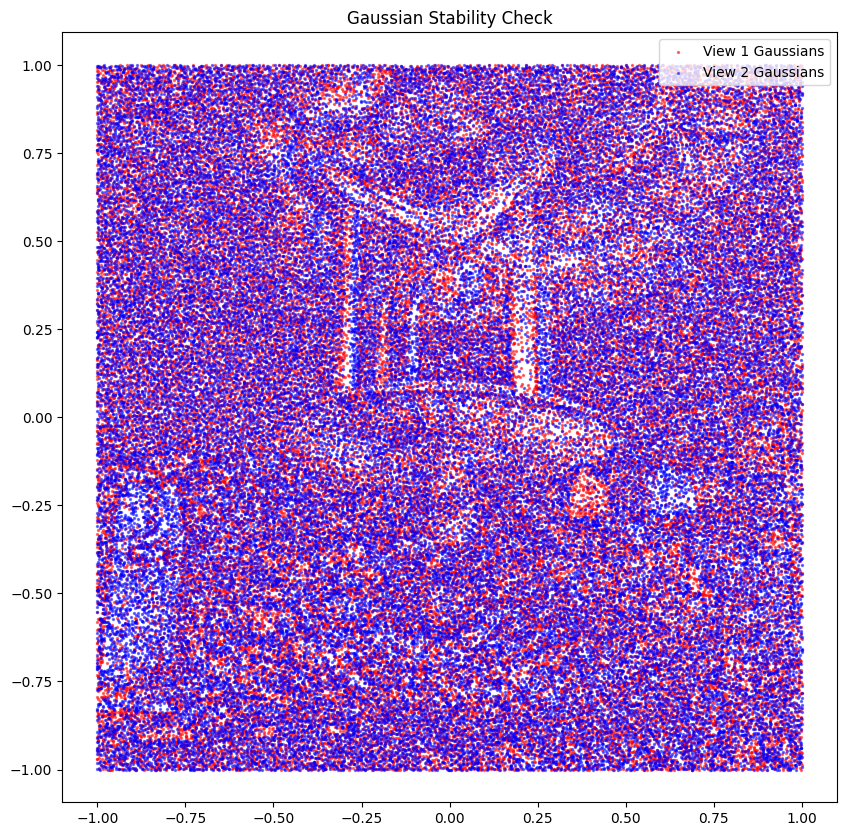

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_stability(xy1, xy2, title="Gaussian Stability Check"):
    plt.figure(figsize=(10, 10))
    
    # Plot Image 1 Points in Red
    plt.scatter(xy1[:, 0], xy1[:, 1], c='r', s=2, alpha=0.5, label='View 1 Gaussians')
    
    # Plot Image 2 Points in Blue
    # If there is a rotation, they won't overlap perfectly, 
    # but they should have the SAME DENSITY CLUSTERS.
    plt.scatter(xy2[:, 0], xy2[:, 1], c='b', s=2, alpha=0.5, label='View 2 Gaussians')
    
    plt.legend()
    plt.title(title)
    plt.axis('equal')
    plt.show()

# Run this on your raw gaussian coordinates
visualize_stability(gaussians1[:, 0:2], gaussians2[:, 0:2])

In [61]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2

# ==========================================
# 1. Math Helpers (Gradient & Covariance)
# ==========================================

def build_covariance(scale, theta):
    c = torch.cos(theta)
    s = torch.sin(theta)
    s0_sq = scale[:, 0]**2
    s1_sq = scale[:, 1]**2
    
    cov = torch.zeros(scale.shape[0], 2, 2, device=scale.device)
    cov[:, 0, 0] = c**2 * s0_sq + s**2 * s1_sq
    cov[:, 0, 1] = c * s * (s0_sq - s1_sq)
    cov[:, 1, 0] = cov[:, 0, 1]
    cov[:, 1, 1] = s**2 * s0_sq + c**2 * s1_sq
    return cov

def gaussian_density_gradient_batch(sample_pts, neighbor_mu, neighbor_cov, neighbor_w):
    """
    Computes analytic gradient of the Sum of Gaussians density field.
    sample_pts:   [B, Grid_Size, 2]
    neighbor_mu:  [B, K, 2]
    neighbor_cov: [B, K, 2, 2]
    neighbor_w:   [B, K]
    """
    B, G, _ = sample_pts.shape
    _, K, _ = neighbor_mu.shape
    
    # Diff: [B, G, K, 2]
    diff = sample_pts.unsqueeze(2) - neighbor_mu.unsqueeze(1) 
    
    # Inverse Covariance with stability epsilon
    eye = torch.eye(2, device=sample_pts.device).view(1, 1, 2, 2) * 1e-6
    # [B, K, 2, 2]
    inv_sigma = torch.inverse(neighbor_cov.unsqueeze(1) + eye).squeeze(1) 
    
    # Mahalanobis: (x-u)^T * Sigma^-1 * (x-u)
    # Einsum broadcasting:
    # 'bgki': diff [Batch, Grid, Neighbor, dim_i]
    # 'bkij': inv_sigma [Batch, Neighbor, dim_i, dim_j]
    # -> 'bgkj': Result [Batch, Grid, Neighbor, dim_j]
    term1 = torch.einsum('bgki, bkij -> bgkj', diff, inv_sigma)
    
    mahalanobis = (term1 * diff).sum(dim=-1) # [B, G, K]
    
    # PDF
    det = torch.det(neighbor_cov).unsqueeze(1) # [B, 1, K]
    norm = 2 * torch.pi * torch.sqrt(det.clamp_min(1e-9))
    pdf = torch.exp(-0.5 * mahalanobis) / norm # [B, G, K]
    weighted_pdf = pdf * neighbor_w.unsqueeze(1)
    
    # Gradient: -PDF * (Sigma^-1 * diff)
    grad_contributions = -weighted_pdf.unsqueeze(-1) * term1
    total_grad = grad_contributions.sum(dim=2) # [B, G, 2]
    
    return total_grad

def get_knn_chunked(queries, database, k=32, chunk_size=1000):
    """
    Finds k nearest neighbors of 'queries' inside 'database'.
    queries: [M, 2]
    database: [N, 2]
    """
    M = queries.shape[0]
    indices = []
    
    for i in range(0, M, chunk_size):
        end = min(i + chunk_size, M)
        q_chunk = queries[i:end]
        dists = torch.cdist(q_chunk, database)
        _, idx = dists.topk(k, largest=False, dim=1) # [Chunk, K]
        indices.append(idx)
        
    return torch.cat(indices, dim=0)

# ==========================================
# 2. Peak Finder (Geometric Stability)
# ==========================================

def find_density_peaks(gaussians, max_init=5000, iterations=20, lr=0.01, device="cuda"):
    """
    Hill-climbing to find stable local maxima in the gaussian density field.
    """
    gauss_tensor = torch.as_tensor(gaussians, device=device, dtype=torch.float32)
    N = gauss_tensor.shape[0]
    
    # 1. Initialize Probes at most opaque gaussians
    opacity = gauss_tensor[:, 5]
    init_k = min(max_init, N)
    _, top_idx = opacity.topk(init_k)
    probes = gauss_tensor[top_idx, 0:2].clone().detach() # [K, 2]
    
    # Prepare Data for Gradient calc
    all_mu = gauss_tensor[:, 0:2]
    all_scale = gauss_tensor[:, 2:4]
    all_rot = gauss_tensor[:, 4]
    all_w = gauss_tensor[:, 5]
    all_cov = build_covariance(all_scale, all_rot)
    
    # 2. Gradient Ascent
    chunk_size = 500
    
    for it in range(iterations):
        for i in range(0, init_k, chunk_size):
            end = min(i + chunk_size, init_k)
            p_chunk = probes[i:end] # [Batch, 2]
            
            # Find neighbors (only local gaussians affect gradient)
            dists = torch.cdist(p_chunk, all_mu)
            _, nn_idx = dists.topk(64, largest=False, dim=1)
            
            n_mu = all_mu[nn_idx]
            n_cov = all_cov[nn_idx]
            n_w = all_w[nn_idx]
            
            # Compute Gradient (Treat probe as grid of size 1)
            # Input: [Batch, 1, 2]
            grads = gaussian_density_gradient_batch(p_chunk.unsqueeze(1), n_mu, n_cov, n_w).squeeze(1)
            
            # Update
            probes[i:end] += lr * grads
            probes[i:end].clamp_(-1.0, 1.0)
            
    # 3. Deduplicate (Grid Hashing)
    grid_res = 200 # Resolution for merging
    discrete = ((probes + 1.0) / 2.0 * grid_res).long()
    hashes = discrete[:, 1] * grid_res + discrete[:, 0]
    
    unique_hashes, inverse_indices = torch.unique(hashes, return_inverse=True)
    
    # Pick one probe per unique hash cell
    perm = torch.arange(inverse_indices.size(0), dtype=inverse_indices.dtype, device=inverse_indices.device)
    unique_idx = perm.new_empty(unique_hashes.size(0)).scatter_(0, inverse_indices, perm)
    
    stable_peaks = probes[unique_idx]
    return stable_peaks

# ==========================================
# 3. Density SIFT Descriptor (Refactored)
# ==========================================

def density_sift_v2(gaussians, override_targets=None, max_points=2000, neighbor_k=32, grid_size=4, bins=8, patch_scale=0.05, device=None):
    """
    Computes Density SIFT. 
    If 'override_targets' is provided, computes descriptors at those specific coordinates.
    """
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    
    gauss_tensor = torch.as_tensor(gaussians, device=device, dtype=torch.float32)
    N_total = gauss_tensor.shape[0]
    
    # 1. Determine Targets
    if override_targets is not None:
        # Use provided stable peaks
        if isinstance(override_targets, np.ndarray):
            t_mu = torch.from_numpy(override_targets).float().to(device)
        else:
            t_mu = override_targets.float().to(device)
        idx = torch.arange(t_mu.shape[0], device=device)
    else:
        # Random sampling (Original mode)
        idx = torch.randperm(N_total, device=device)[:max_points]
        targets = gauss_tensor[idx]
        t_mu = targets[:, 0:2]

    # 2. Find Neighbors for Targets
    # We find neighbors of 't_mu' inside the full 'gauss_tensor'
    safe_mem = 500 * 1024 * 1024 
    adaptive_chunk = max(10, int(safe_mem / (4 * N_total)))
    
    # Queries: t_mu [M, 2], Database: gauss_tensor [N, 2]
    nn_idx = get_knn_chunked(t_mu, gauss_tensor[:,0:2], k=neighbor_k, chunk_size=adaptive_chunk)
    
    n_data = gauss_tensor[nn_idx] # [M, K, 6]
    n_mu = n_data[..., 0:2]
    n_scale = n_data[..., 2:4]
    n_rot = n_data[..., 4]
    n_w = n_data[..., 5]
    n_cov = build_covariance(n_scale.reshape(-1, 2), n_rot.reshape(-1)).view(t_mu.shape[0], neighbor_k, 2, 2)

    # 3. Determine Orientation (Ring Method)
    # Since peaks don't have rotation, we must compute it from the field.
    ring_res = 12
    angles = torch.linspace(0, 2*torch.pi, ring_res, device=device)
    base_ring = torch.stack([torch.cos(angles), torch.sin(angles)], dim=-1) # [R, 2]
    
    # Radius is fixed by patch_scale (since we use normalized coords)
    radius = patch_scale 
    ring_pts = t_mu.unsqueeze(1) + base_ring.unsqueeze(0) * radius # [M, R, 2]
    
    ring_grads = gaussian_density_gradient_batch(ring_pts, n_mu, n_cov, n_w)
    avg_grad = ring_grads.sum(dim=1) # [M, 2]
    
    computed_theta = torch.atan2(avg_grad[:, 1], avg_grad[:, 0]) # [M]

    # 4. Build Final Grid (Rotated)
    res = grid_size * 2
    steps = torch.linspace(-1, 1, res, device=device)
    y, x = torch.meshgrid(steps, steps, indexing="ij")
    base_grid = torch.stack([x, y], dim=-1).reshape(-1, 2)
    
    c = torch.cos(computed_theta); s = torch.sin(computed_theta)
    R = torch.stack([torch.stack([c, -s], dim=-1), torch.stack([s, c], dim=-1)], dim=-2)
    
    offsets = torch.einsum('mij,gj->mgi', R, base_grid) * radius
    sample_pts = t_mu.unsqueeze(1) + offsets
    
    # 5. Compute Final Gradients
    grads = gaussian_density_gradient_batch(sample_pts, n_mu, n_cov, n_w)
    
    mag = torch.linalg.norm(grads, dim=-1)
    ang = torch.atan2(grads[..., 1], grads[..., 0])
    
    # Normalize angles relative to computed orientation
    rel_ang = (ang - computed_theta.unsqueeze(1)) % (2 * torch.pi)
    
    # 6. Histogramming
    cell_x = ((base_grid[:, 0] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    cell_y = ((base_grid[:, 1] + 1) / 2 * grid_size).long().clamp(0, grid_size-1)
    spatial_idx = cell_y * grid_size + cell_x
    
    ang_idx = (rel_ang / (2 * torch.pi) * bins).long().clamp(0, bins - 1)
    flat_idx = spatial_idx.unsqueeze(0) * bins + ang_idx
    
    desc = torch.zeros(t_mu.shape[0], grid_size*grid_size*bins, device=device)
    desc.scatter_add_(1, flat_idx, mag)
    
    # RootSIFT Normalization
    desc = torch.sqrt(desc / (torch.norm(desc, dim=1, keepdim=True) + 1e-8))
    
    return t_mu.cpu().numpy(), desc.cpu().numpy(), idx.cpu().numpy()

# ==========================================
# 4. The Pipeline Wrapper
# ==========================================

def pure_gaussian_match_pipeline(gaussians1, gaussians2, device="cuda"):
    print("Step 1: Hill Climbing (Finding stable density peaks)...")
    peaks1 = find_density_peaks(gaussians1, max_init=5000, device=device)
    peaks2 = find_density_peaks(gaussians2, max_init=5000, device=device)
    
    print(f"Peaks found: {len(peaks1)} vs {len(peaks2)}")
    
    print("Step 2: Computing Density Descriptors at peaks...")
    # patch_scale=0.05 is ~2.5% of the image width in normalized space
    xy1, desc1, _ = density_sift_v2(gaussians1, override_targets=peaks1, patch_scale=0.05, device=device)
    xy2, desc2, _ = density_sift_v2(gaussians2, override_targets=peaks2, patch_scale=0.05, device=device)
    
    print("Step 3: Matching Descriptors...")
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(desc1, desc2, k=2)
    
    pts1 = []
    pts2 = []
    good_indices = []
    
    for m, n in matches:
        if m.distance < 0.8 * n.distance:
            pts1.append(xy1[m.queryIdx])
            pts2.append(xy2[m.trainIdx])
            good_indices.append([m.queryIdx, m.trainIdx])
            
    return np.array(pts1), np.array(pts2), np.array(good_indices)

# Example Usage:
# p1, p2, matches = pure_gaussian_match_pipeline(gaussians1, gaussians2)

In [62]:
p1, p2, matches = pure_gaussian_match_pipeline(gaussians1, gaussians2)

Step 1: Hill Climbing (Finding stable density peaks)...
Peaks found: 2878 vs 2780
Step 2: Computing Density Descriptors at peaks...
Step 3: Matching Descriptors...


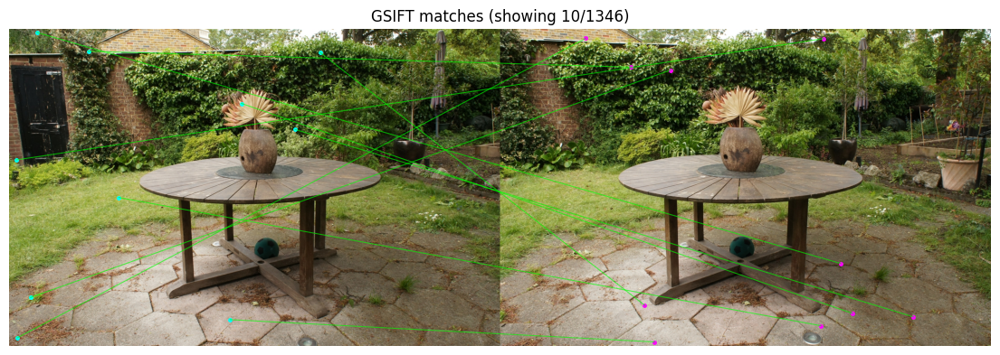

In [65]:
import numpy as np
import matplotlib.pyplot as plt

# ... (assume xy1_sel, xy2_sel, gt_img1, gt_img2, matches are defined)

# 1. Coordinate conversion (assuming you have this helper or logic)
xy1_px_sel = xy_to_pixel(xy1_sel, gt_img1)
xy2_px_sel = xy_to_pixel(xy2_sel, gt_img2)
offset_x = gt_img1.shape[1]

# 2. Select a random subset of matches to visualize
N_visualize = 10  # Change this number to control density
if len(matches) > N_visualize:
    # Randomly choose indices without replacement
    choice_idx = np.random.choice(len(matches), N_visualize, replace=False)
    matches_subset = matches[choice_idx]
else:
    matches_subset = matches

# 3. Plot
canvas = np.concatenate([gt_img1, gt_img2], axis=1)
plt.figure(figsize=(14, 8))
plt.imshow(canvas)

# Iterate only over the subset
for i, j in matches_subset.tolist():
    p1 = xy1_px_sel[i]
    p2 = xy2_px_sel[j] + np.array([offset_x, 0])
    
    # Plot line
    plt.plot([p1[0], p2[0]], [p1[1], p2[1]], c='lime', linewidth=0.8, alpha=0.6)
    # Plot endpoints
    plt.scatter(p1[0], p1[1], c='cyan', s=6)
    plt.scatter(p2[0], p2[1], c='magenta', s=6)

plt.axis('off')
plt.title(f'GSIFT matches (showing {len(matches_subset)}/{len(matches)})')
plt.show()

In [116]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

def ri_gaussian_shape_context_chunked(gaussians, max_points=1000, radius=0.2, num_rings=4, num_sectors=12, chunk_size=50, device=None):
    """
    Memory-Safe Rotation-Invariant Gaussian Shape Context.
    Processes keypoints in chunks to prevent OOM on large scenes.
    """
    # 1. CLEANUP
    torch.cuda.empty_cache()
    
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    g_data = torch.as_tensor(gaussians, device=device, dtype=torch.float32)
    pos = g_data[:, 0:2]
    opacity = g_data[:, 5]
    
    # 2. SELECT KEYPOINTS
    # Filter for high opacity
    valid_mask = opacity > 0.1
    valid_indices = torch.nonzero(valid_mask).squeeze()
    
    # Shuffle and select
    shuffled_idx = valid_indices[torch.randperm(len(valid_indices), device=device)]
    
    # Ensure we don't crash if scene is empty
    if len(shuffled_idx) == 0:
        return np.array([]), np.array([]), np.array([])
        
    idx = shuffled_idx[:max_points]
    keypoints_all = pos[idx]       # [K, 2]
    
    # Prepare Output Containers
    num_bins = num_rings * num_sectors
    all_descriptors = []
    
    # 3. CHUNKED PROCESSING LOOP
    # We process 'chunk_size' keypoints at a time
    K = len(keypoints_all)
    
    for i in range(0, K, chunk_size):
        end = min(i + chunk_size, K)
        
        # Batch of keypoints: [B, 2]
        kp_batch = keypoints_all[i:end]
        B = len(kp_batch)
        
        # A. Find Neighbors (Distance Matrix for Batch)
        # [B, N] -- This is much smaller now
        dists = torch.cdist(kp_batch, pos) 
        mask = dists < radius
        
        # B. Compute Canonical Orientation (Local CoM)
        # Weights: [B, N]
        weights = opacity.unsqueeze(0) * mask.float()
        w_sum = weights.sum(dim=1, keepdim=True) + 1e-9
        
        # Local CoM: [B, 2]
        # (pos [1, N, 2] * weights [B, N, 1]) -> sum -> [B, 2]
        local_com = (pos.unsqueeze(0) * weights.unsqueeze(2)).sum(dim=1) / w_sum
        
        # Orient Vector: KP -> CoM
        orient_vec = local_com - kp_batch
        theta_0 = torch.atan2(orient_vec[:, 1], orient_vec[:, 0]) # [B]
        
        # C. Compute Relative Coordinates (The OOM Danger Zone)
        # Now it is only [B, N, 2] -> e.g. 50 * 3M * 2 * 4bytes = 1.2 GB (Safe)
        diff = pos.unsqueeze(0) - kp_batch.unsqueeze(1)
        
        r = torch.norm(diff, dim=2)
        theta = torch.atan2(diff[..., 1], diff[..., 0]) # [B, N]
        
        # D. Rotation Correction
        theta_rel = theta - theta_0.unsqueeze(1)
        theta_rel = (theta_rel + torch.pi) % (2 * torch.pi) - torch.pi
        
        # E. Binning
        r_norm = r / radius
        r_bin = (r_norm * num_rings).long().clamp(0, num_rings - 1)
        
        theta_0to1 = (theta_rel + torch.pi) / (2 * torch.pi)
        a_bin = (theta_0to1 * num_sectors).long() % num_sectors
        
        # Flatten Bin IDs: [B, N]
        bin_ids = r_bin * num_sectors + a_bin 
        
        # F. Accumulate Histogram (Scatter)
        # Offset for scatter into batch-flattened descriptor
        row_offsets = torch.arange(B, device=device) * num_bins
        global_bin_ids = bin_ids + row_offsets.unsqueeze(1) # [B, N]
        
        batch_desc = torch.zeros(B * num_bins, device=device)
        batch_desc.scatter_add_(0, global_bin_ids.view(-1), weights.view(-1))
        
        batch_desc = batch_desc.view(B, num_bins)
        
        # Normalize
        batch_desc = batch_desc / (torch.norm(batch_desc, dim=1, keepdim=True) + 1e-8)
        
        all_descriptors.append(batch_desc.cpu())
        
        # Explicit delete to free VRAM for next loop
        del diff, dists, mask, weights
    
    # Concatenate results
    if len(all_descriptors) > 0:
        final_desc = torch.cat(all_descriptors, dim=0)
    else:
        final_desc = torch.empty((0, num_bins))

    return keypoints_all.cpu().numpy(), final_desc.numpy(), idx.cpu().numpy()

# ==========================================
# 4. RUN WITH SAFETY
# ==========================================

print("Generating RI-GSC Descriptors (Chunked Mode)...")
# chunk_size=50 is very safe (uses ~1.5GB VRAM peak for dense scenes)
xy1, desc1, idx1 = ri_gaussian_shape_context_chunked(gaussians1, max_points=1000, radius=0.2, chunk_size=50)
xy2, desc2, idx2 = ri_gaussian_shape_context_chunked(gaussians2, max_points=1000, radius=0.2, chunk_size=50)

print(f"Done. Descriptors: {desc1.shape}")

# ... Continue with your matching code (BFMatcher + RANSAC) ...
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(desc1, desc2)
print(f"Raw Matches: {len(matches)}")

p1 = np.array([xy1[m.queryIdx] for m in matches])
p2 = np.array([xy2[m.trainIdx] for m in matches])

if len(p1) > 8:
    F, mask = cv2.findFundamentalMat(p1, p2, cv2.FM_RANSAC, 0.03, 0.99)
    if mask is not None:
        p1_clean = p1[mask.ravel()==1]
        p2_clean = p2[mask.ravel()==1]
        print(f"RANSAC Inliers: {len(p1_clean)} / {len(p1)}")
        # visualize_matches(gt_img1, gt_img2, p1_clean, p2_clean)

Generating RI-GSC Descriptors (Chunked Mode)...


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 23.99 GiB of which 0 bytes is free. Of the allocated memory 23.03 GiB is allocated by PyTorch, and 18.03 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [97]:
# 1. Build Descriptors
# radius=0.2 means we merge everything within 20% of the normalized unit square
xy1, desc1, idx1 = super_gaussian_invariant_descriptor(gaussians1, max_points=2000, radius=1.0)
xy2, desc2, idx2 = super_gaussian_invariant_descriptor(gaussians2, max_points=2000, radius=1.0)

# 2. Match (Standard OpenCV or Scikit-Learn)
# Since we L2 normalized the descriptors, Euclidean distance works perfectly.
import cv2
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(desc1, desc2)

# 3. Extract Points for Visualization
pts1 = []
pts2 = []
for m in matches:
    pts1.append(xy1[m.queryIdx]) # Note: We use the MERGED xy, not original
    pts2.append(xy2[m.trainIdx])

pts1 = np.array(pts1)
pts2 = np.array(pts2)

print(f"Matches found: {len(pts1)}")

# 4. Visual Validation
# (Insert your 'plt.plot' code here using pts1 and pts2)

Matches found: 982


Clean Matches: 50 (Removed 1382 outliers)


C:\Users\Eric\AppData\Local\Temp\ipykernel_72992\1161048350.py:65: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(start[0], start[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_72992\1161048350.py:66: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(end_shifted[0], end_shifted[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)


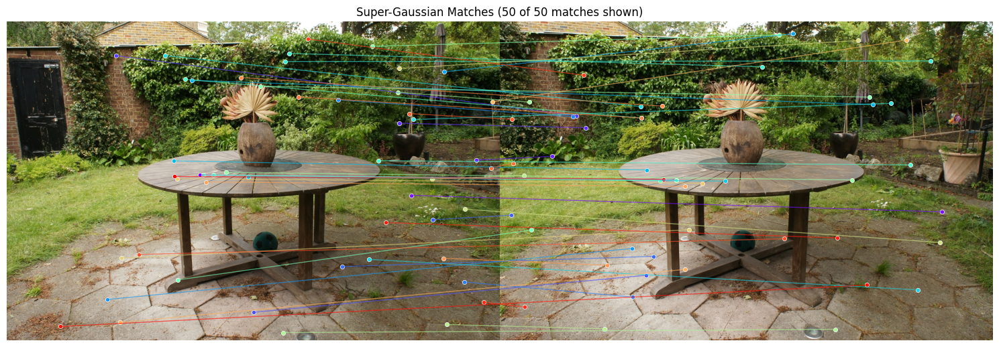

In [101]:
import cv2
import numpy as np

# 1. Generate Invariant Descriptors
xy1, desc1, idx1 = super_gaussian_invariant_descriptor(gaussians1, max_points=2000, radius=0.2)
xy2, desc2, idx2 = super_gaussian_invariant_descriptor(gaussians2, max_points=2000, radius=0.2)

# 2. KNN Match (Ratio Test)
bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(desc1, desc2, k=2)

good_pts1 = []
good_pts2 = []

for m, n in matches:
    # Relaxed ratio test (0.85) because shape matching is fuzzier than texture
    if m.distance < 0.85 * n.distance: 
        good_pts1.append(xy1[m.queryIdx])
        good_pts2.append(xy2[m.trainIdx])

p1 = np.array(good_pts1)
p2 = np.array(good_pts2)

# 3. GEOMETRIC FILTER (RANSAC)
# This removes the "messy" lines that cross randomly
if len(p1) > 8:
    # Use 0.01 threshold for Normalized Coords (-1 to 1)
    # Use 3.0 threshold for Pixel Coords
    thresh = 0.02 
    F, mask = cv2.findFundamentalMat(p1, p2, cv2.FM_RANSAC, thresh, 0.99)
    
    if mask is not None:
        p1_clean = p1[mask.ravel() == 1]
        p2_clean = p2[mask.ravel() == 1]
        print(f"Clean Matches: {len(p1_clean)} (Removed {len(p1) - len(p1_clean)} outliers)")
        
        # Visualize only the CLEAN points
        visualize_matches(gt_img1, gt_img2, p1_clean, p2_clean, subset_size=50)
    else:
        print("RANSAC failed to find a model.")
else:
    print("Not enough matches for RANSAC.")

In [102]:
import numpy as np
import cv2
from scipy.spatial.distance import cdist

def automated_sanity_check(pts1, pts2, threshold=0.02):
    """
    Automated Report Card for Feature Matching.
    pts1, pts2: Normalized coordinates [-1, 1].
    """
    report = {}
    N = len(pts1)
    
    if N < 8:
        print("❌ FAIL: Not enough matches to even test (Need > 8).")
        return False
    
    # --- TEST 1: Epipolar Geometry (RANSAC) ---
    # We try to fit a Fundamental Matrix. If matches are random, this fails hard.
    F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, threshold, 0.99)
    
    if mask is None:
        inliers = 0
    else:
        inliers = mask.ravel().sum()
        
    inlier_ratio = inliers / N
    report['inlier_ratio'] = inlier_ratio
    
    # Critical Thresholds
    # < 0.20: Likely Random Noise (Garbage)
    # 0.20 - 0.50: Weak / Noisy
    # > 0.50: Strong Lock
    
    # --- TEST 2: Residual Error (Accuracy) ---
    if inliers > 8:
        # Select only inliers for error checking
        p1_in = pts1[mask.ravel() == 1]
        p2_in = pts2[mask.ravel() == 1]
        
        # Compute Sampson Error or simple Algebraic Error (p2*F*p1)
        # We'll use simple algebraic for speed: sum((x2^T * F * x1)^2)
        
        # Homogenize
        p1_h = np.concatenate([p1_in, np.ones((len(p1_in), 1))], axis=1)
        p2_h = np.concatenate([p2_in, np.ones((len(p2_in), 1))], axis=1)
        
        # Error = diag(p2_h * F * p1_h.T)
        F_p1 = F @ p1_h.T
        error = np.sum(p2_h.T * F_p1, axis=0)
        rmse = np.sqrt(np.mean(error**2))
        report['residual_error'] = rmse
    else:
        report['residual_error'] = 999.0

    # --- TEST 3: Topology Preservation (The "Explosion" Test) ---
    # If the match is real, neighbors should stay neighbors.
    # We check the 5 nearest neighbors of the first 20 points.
    
    sample_sz = min(20, N)
    subset_idx = np.random.choice(N, sample_sz, replace=False)
    
    topo_score = 0.0
    
    # Distance matrices
    d1 = cdist(pts1, pts1)
    d2 = cdist(pts2, pts2)
    
    for idx in subset_idx:
        # Who are the neighbors in View 1?
        nn1 = np.argsort(d1[idx])[1:6] # Top 5 closest (excluding self)
        
        # Who are the neighbors in View 2?
        nn2 = np.argsort(d2[idx])[1:6]
        
        # Intersection over Union of neighborhoods
        intersection = len(np.intersect1d(nn1, nn2))
        topo_score += intersection / 5.0
        
    report['topology_consistency'] = topo_score / sample_sz
    
    # --- FINAL VERDICT ---
    print("-" * 40)
    print(f"🔍 AUTOMATED CHECK REPORT ({N} matches)")
    print("-" * 40)
    
    print(f"1. Inlier Ratio:      {inlier_ratio:.2%}   ", end="")
    if inlier_ratio > 0.4: print("✅ EXCELLENT")
    elif inlier_ratio > 0.2: print("⚠️ ACCEPTABLE")
    else: print("❌ FAILURE (Random Noise)")
        
    print(f"2. Residual Error:    {report['residual_error']:.5f}  ", end="")
    if report['residual_error'] < 0.05: print("✅ LOW")
    else: print("⚠️ HIGH")
        
    print(f"3. Topology Score:    {report['topology_consistency']:.2%}   ", end="")
    if report['topology_consistency'] > 0.3: print("✅ CONSISTENT")
    else: print("❌ INCONSISTENT (Scene scrambled)")
    
    print("-" * 40)
    
    is_pass = (inlier_ratio > 0.2) and (report['topology_consistency'] > 0.1)
    return is_pass

# --- USAGE ---
# Pass your raw matched coordinates (before RANSAC filtering)
# pts1, pts2 should be from the 'match_super_gaussians' function
passed = automated_sanity_check(p1, p2)

----------------------------------------
🔍 AUTOMATED CHECK REPORT (1432 matches)
----------------------------------------
1. Inlier Ratio:      3.49%   ❌ FAILURE (Random Noise)
2. Residual Error:    0.23740  ⚠️ HIGH
3. Topology Score:    1.00%   ❌ INCONSISTENT (Scene scrambled)
----------------------------------------


C:\Users\Eric\AppData\Local\Temp\ipykernel_72992\1161048350.py:65: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(start[0], start[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)
C:\Users\Eric\AppData\Local\Temp\ipykernel_72992\1161048350.py:66: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(end_shifted[0], end_shifted[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)


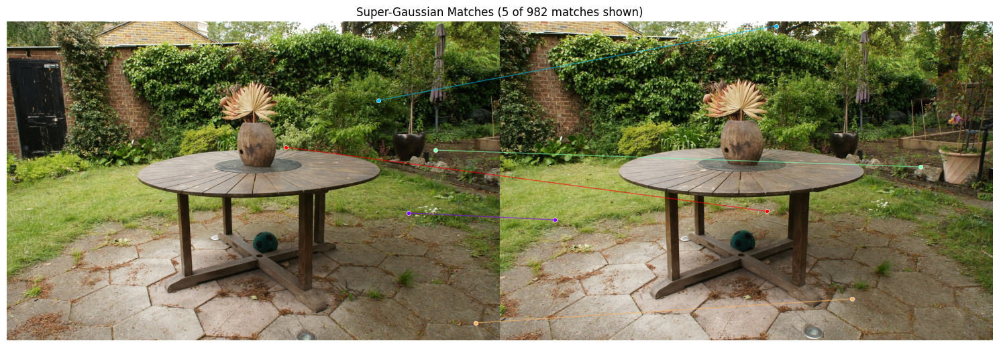

In [99]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_matches(img1, img2, pts1, pts2, subset_size=50, title="Super-Gaussian Matches"):
    """
    Visualizes matches between two images side-by-side.
    
    Args:
        img1, img2: Numpy arrays of the rendered images (H, W, 3).
        pts1, pts2: Matched coordinates [N, 2].
                    Assumed to be NORMALIZED [-1, 1].
        subset_size: Number of random lines to draw (prevents clutter).
    """
    if len(pts1) == 0:
        print("No matches to visualize.")
        return

    H, W = img1.shape[:2]
    
    # 1. Coordinate Conversion: Normalized [-1, 1] -> Pixels [0, W]
    # If your points are already pixels, skip this math.
    if pts1.max() <= 1.1: 
        # Convert [-1, 1] to [0, W/H]
        # Note: Y-axis might need flipping depending on your renderer. 
        # Standard NeRF/GSplat usually puts (0,0) center, Y-up or Y-down.
        # This assumes standard normalized coordinates:
        p1_px = (pts1 + 1.0) / 2.0 * np.array([W, H])
        p2_px = (pts2 + 1.0) / 2.0 * np.array([W, H])
    else:
        # Already pixels
        p1_px = pts1
        p2_px = pts2

    # 2. Setup Canvas
    # Concatenate images side-by-side
    canvas = np.concatenate([img1, img2], axis=1)
    offset = W # X-offset for the second image

    plt.figure(figsize=(15, 8))
    plt.imshow(canvas)
    
    # 3. Select Subset
    N = len(p1_px)
    if N > subset_size:
        indices = np.random.choice(N, subset_size, replace=False)
    else:
        indices = range(N)

    # 4. Draw Lines and Points
    # We use a colormap to make lines distinct
    colors = plt.cm.rainbow(np.linspace(0, 1, len(indices)))

    for i, idx in enumerate(indices):
        start = p1_px[idx]
        end = p2_px[idx]
        
        # Shift end point to the second image
        end_shifted = [end[0] + offset, end[1]]
        
        # Draw Line
        plt.plot([start[0], end_shifted[0]], [start[1], end_shifted[1]], 
                 c=colors[i], alpha=0.6, linewidth=1.0)
        
        # Draw Endpoints (Circles)
        plt.scatter(start[0], start[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)
        plt.scatter(end_shifted[0], end_shifted[1], c=colors[i], s=20, edgecolors='white', linewidths=0.5)

    plt.title(f"{title} ({len(indices)} of {N} matches shown)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# --- USAGE ---
# Assuming you ran the matcher code from the previous step:
# pts1, pts2 are the matched coordinates
# gt_img1, gt_img2 are your rendered images (numpy arrays)

visualize_matches(gt_img1, gt_img2, pts1, pts2, subset_size=5)

In [77]:
import cv2

# 1. Extract the actual point coordinates from your match indices
# matches is [N, 2] indices into xy1_sel and xy2_sel
pts1 = xy1_sel[matches[:, 0]]
pts2 = xy2_sel[matches[:, 1]]

# 2. Run RANSAC
# method=cv2.RANSAC, ransacReprojThreshold=3.0 (pixels)
# Returns: M (3x3 Homography matrix), mask (inlier mask)
M, mask = cv2.findFundamentalMat(pts1, pts2, method=cv2.RANSAC,ransacReprojThreshold=0.01)

# 3. Filter your matches to keep only inliers
matches_inliers = matches[mask.ravel() == 1]

print(f"Original matches: {len(matches)}")
print(f"RANSAC Inliers: {len(matches_inliers)}")

TypeError: tuple indices must be integers or slices, not tuple

In [78]:
import torch
import numpy as np

def diagnose_data(gaussians, name="View"):
    g_tensor = torch.as_tensor(gaussians, device="cpu")
    
    # 1. Check XY Correlation
    x = g_tensor[:, 0].numpy()
    y = g_tensor[:, 1].numpy()
    
    print(f"--- {name} Diagnosis ---")
    print(f"X Range: [{x.min():.3f}, {x.max():.3f}]")
    print(f"Y Range: [{y.min():.3f}, {y.max():.3f}]")
    print(f"Mean Opacity: {g_tensor[:, 5].mean():.3f}")
    
    # Check for the diagonal line issue
    correlation = np.corrcoef(x, y)[0, 1]
    print(f"X-Y Correlation: {correlation:.4f} (Should be close to 0, not 1.0)")
    
    if abs(correlation) > 0.9:
        print("⚠️ ALARM: X and Y are highly correlated! This causes the diagonal line.")
        print("Did you initialize positions as x=y? Or map columns wrong?")

# Run on your inputs
diagnose_data(gaussians1, "View 1")
diagnose_data(gaussians2, "View 2")

--- View 1 Diagnosis ---
X Range: [-1.000, 1.000]
Y Range: [-1.000, 1.000]
Mean Opacity: 1.000
X-Y Correlation: -0.0265 (Should be close to 0, not 1.0)
--- View 2 Diagnosis ---
X Range: [-1.000, 1.000]
Y Range: [-1.000, 1.000]
Mean Opacity: 1.000
X-Y Correlation: -0.0150 (Should be close to 0, not 1.0)


IndexError: index 1061 is out of bounds for axis 0 with size 984

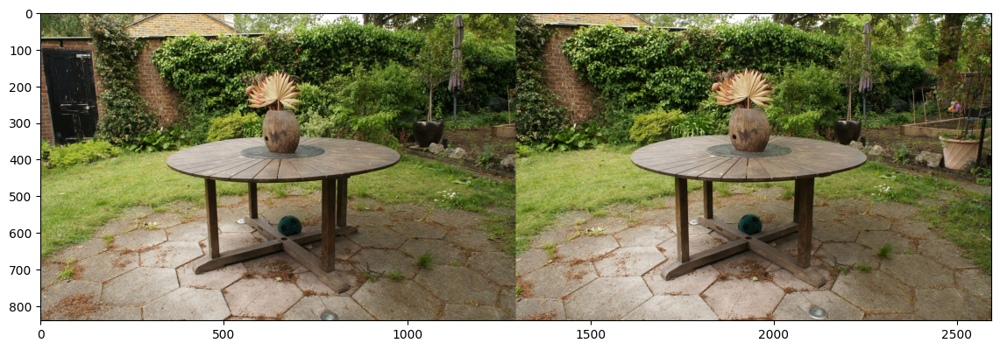

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ... (assume xy1_sel, xy2_sel, gt_img1, gt_img2, matches are defined)

# 1. Coordinate conversion (assuming you have this helper or logic)
xy1_px_sel = xy_to_pixel(xy1_sel, gt_img1)
xy2_px_sel = xy_to_pixel(xy2_sel, gt_img2)
offset_x = gt_img1.shape[1]

# 2. Select a random subset of matches to visualize
N_visualize = 50  # Change this number to control density
if len(matches_inliers) > N_visualize:
    # Randomly choose indices without replacement
    choice_idx = np.random.choice(len(matches_inliers), N_visualize, replace=False)
    matches_subset = matches_inliers[choice_idx]
else:
    matches_subset = matches_inliers

# 3. Plot
canvas = np.concatenate([gt_img1, gt_img2], axis=1)
plt.figure(figsize=(14, 8))
plt.imshow(canvas)

# Iterate only over the subset
for i, j in matches_subset.tolist():
    p1 = xy1_px_sel[i]
    p2 = xy2_px_sel[j] + np.array([offset_x, 0])
    
    # Plot line
    plt.plot([p1[0], p2[0]], [p1[1], p2[1]], c='lime', linewidth=0.8, alpha=0.6)
    # Plot endpoints
    plt.scatter(p1[0], p1[1], c='cyan', s=6)
    plt.scatter(p2[0], p2[1], c='magenta', s=6)

plt.axis('off')
plt.title(f'GSIFT matches (showing {len(matches_subset)}/{len(matches_inliers)})')
plt.show()